In [1]:
import pandas as pd
import numpy as пр
import matplotlib.pyplot as plt
import statsmodels.api as sm
from pygam import GAM, ExpectileGAM, s, l, f
from sklearn.preprocessing import LabelEncoder
import plotly. express as px
from plotnine import *
import pytimetk as tk
import textwrap


In [2]:
df = pd.read_csv('store.csv')

In [3]:
df.sample(10)

,date,price,qty,sell_id,sell_cat,item,year,holiday,is_weekend,is_schoolbreak,avg_temperature,is_outdoor
7895,9/7/14,12.77,30,2053,2,COFFEE,2014,NaN,1,0,73.4,1
4398,6/27/13,12.46,48,2053,2,COKE,2013,NaN,0,0,75.2,1
7141,6/5/14,11.48,56,2053,2,BURGER,2014,NaN,0,0,73.4,1
345,2/13/12,12.73,30,2051,2,BURGER,2012,NaN,0,0,32.0,1
1645,7/25/12,10.47,62,2053,2,BURGER,2012,NaN,0,0,78.8,1
3622,3/22/13,13.41,40,2053,2,COKE,2013,NaN,0,0,41.0,1
3346,2/23/13,13.13,18,2051,2,COKE,2013,NaN,1,0,33.8,1
6298,2/20/14,13.27,36,2051,2,COKE,2014,NaN,0,0,30.2,0
5569,11/21/13,10.97,34,2051,2,BURGER,2013,NaN,0,0,41.0,1
8492,11/21/14,12.85,22,2052,2,LEMONADE,2014,NaN,0,0,39.2,1


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10840 entries, 0 to 10839
Data columns (total 12 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   date             10840 non-null  object 
 1   price            10840 non-null  float64
 2   qty              10840 non-null  int64  
 3   sell_id          10840 non-null  int64  
 4   sell_cat         10840 non-null  int64  
 5   item             10840 non-null  object 
 6   year             10840 non-null  int64  
 7   holiday          840 non-null    object 
 8   is_weekend       10840 non-null  int64  
 9   is_schoolbreak   10840 non-null  int64  
 10  avg_temperature  10840 non-null  float64
 11  is_outdoor       10840 non-null  int64  
dtypes: float64(2), int64(7), object(3)
memory usage: 1016.4+ KB


In [5]:
df['holiday'].unique()

array(['New Year', nan, 'Luner New Year', 'Qing Ming Festival',
       'Labor Day', 'Dragon Boat Festivel', 'Mid-Autumn Day',
       'National Day', 'WWII Celebration'], dtype=object)

In [6]:
df['item'].unique()

array(['BURGER', 'COKE', 'LEMONADE', 'COFFEE'], dtype=object)

In [7]:
# Replace NaN values in 'holiday' column with 'no holiday'
df['holiday'] = df['holiday'].fillna('no holiday')

In [8]:
df['is_event'] = (df['holiday'] != "no holiday") .astype(int).astype(str)
df['revenue'] = df['price'] * df['qty']
df.head()


,date,price,qty,sell_id,sell_cat,item,year,holiday,is_weekend,is_schoolbreak,avg_temperature,is_outdoor,is_event,revenue
0,1/1/12,15.50,46,1070,0,BURGER,2012,New Year,1,0,24.8,0,1,713.00
1,1/1/12,12.73,22,2051,2,BURGER,2012,New Year,1,0,24.8,0,1,280.06
2,1/1/12,12.73,22,2051,2,COKE,2012,New Year,1,0,24.8,0,1,280.06
3,1/1/12,12.75,18,2052,2,BURGER,2012,New Year,1,0,24.8,0,1,229.50
4,1/1/12,12.75,18,2052,2,LEMONADE,2012,New Year,1,0,24.8,0,1,229.50


In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10840 entries, 0 to 10839
Data columns (total 14 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   date             10840 non-null  object 
 1   price            10840 non-null  float64
 2   qty              10840 non-null  int64  
 3   sell_id          10840 non-null  int64  
 4   sell_cat         10840 non-null  int64  
 5   item             10840 non-null  object 
 6   year             10840 non-null  int64  
 7   holiday          10840 non-null  object 
 8   is_weekend       10840 non-null  int64  
 9   is_schoolbreak   10840 non-null  int64  
 10  avg_temperature  10840 non-null  float64
 11  is_outdoor       10840 non-null  int64  
 12  is_event         10840 non-null  object 
 13  revenue          10840 non-null  float64
dtypes: float64(3), int64(7), object(4)
memory usage: 1.2+ MB


In [10]:
df.to_csv('updated_store.csv')

In [11]:
df['date'].min()

'1/1/12'

In [12]:
df['item'].value_counts()

item
BURGER      5420
COKE        2710
LEMONADE    1355
COFFEE      1355
Name: count, dtype: int64

In [13]:
import plotly.express as px

# Assuming 'data' is the DataFrame created earlier
# Correcting the syntax and aligning the code
fig = px.scatter(
    df, 
    x='price', 
    y='qty',
    color='item',
    opacity=0.6, 
    trendline="lowess",  # Corrected trendline parameter
    trendline_color_override="blue",
    template="none",
    title='Product Sales: Price vs Quantity Analysis',
    width=800, 
    height=600
)

# Updating trace, hoverlabel, layout, x-axis, and y-axis properties
fig.update_traces(marker=dict(size=7), hoverlabel=dict(font_size=10))
fig.update_layout(
    legend_title_text='Product',
    title_font_size=16,
    legend_font_size=10
)
fig.update_xaxes(
    title_text='Price',
    title_font=dict(size=10),
    tickfont=dict(size=10)
)
fig.update_yaxes(
    title_text='Quantity Sold',
    title_font=dict(size=10),
    tickfont=dict(size=10)
)

fig


In [14]:
# Enhance the plot with additional features
fig = px.scatter(
    df, 
    x='price', 
    y='qty',
    color='item',
    opacity=0.7,  
    trendline="lowess",
    trendline_color_override="red",  
    template="plotly_white",  
    title='Product Sales: Price vs Quantity Analysis',
    width=900, 
    height=600,
    hover_data=['date', 'holiday']  
)

# Update trace and hoverlabel for better visibility
fig.update_traces(marker=dict(size=10), hoverlabel=dict(font_size=12, bgcolor="white"))

# Update layout for readability
fig.update_layout(
    legend_title_text='Product',
    title_font_size=20,
    legend_font_size=12,
    xaxis_title='Price',
    yaxis_title='Quantity Sold'
)

# Update axis fonts for clarity
fig.update_xaxes(title_font=dict(size=14), tickfont=dict(size=12))
fig.update_yaxes(title_font=dict(size=14), tickfont=dict(size=12))

# Responsive layout
fig.update_layout(autosize=True)

fig.show()

In [15]:


# Create a scatter plot distinguishing price and quantity based on holiday for each item
fig = px.scatter(
    df, 
    x='price', 
    y='qty',
    color='holiday',
    symbol='item',
    opacity=0.7,
    title='Price vs Quantity Analysis by Holiday for Each Item',
    labels={'price': 'Price', 'qty': 'Quantity Sold', 'holiday': 'Holiday', 'item': 'Item'},
    width=900,
    height=600
)

# Update layout for readability and aesthetics
fig.update_layout(
    legend_title_text='Holiday',
    title_font_size=20,
    legend_font_size=12,
    xaxis_title='Price',
    yaxis_title='Quantity Sold',
    template="plotly_white"
)

# Responsive layout
fig.update_layout(autosize=True)

fig.show()



In [16]:

# Creating a separate graph with lowess trend line for each item
unique_items = df['item'].unique()

# Plot configuration
figs = []

for item in unique_items:
    fig = px.scatter(
        df[df['item'] == item], 
        x='price', 
        y='qty',
        color='holiday',
        trendline='lowess',  # Adding lowess trend line
        title=f'Price vs Quantity Analysis for {item} by Holiday',
        labels={'price': 'Price', 'qty': 'Quantity Sold', 'holiday': 'Holiday'},
        width=800,
        height=600
    )
    fig.update_layout(
        legend_title_text='Holiday',
        title_font_size=18,
        legend_font_size=12,
        xaxis_title='Price',
        yaxis_title='Quantity Sold',
        template="plotly_white"
    )
    fig.update_layout(autosize=True)
    figs.append(fig)

# Display the first figure as an example
figs[0].show()



In [17]:
fig = px.scatter(
    df,
    x='price',  
    y='qty',
    color='holiday',  
    facet_col='item', 
    facet_col_wrap=2,
    facet_col_spacing=0.1,  
    facet_row_spacing=0.1,
    opacity=0.6,
    trendline="lowess",      
    template="none",  
    title='Product Sales: Event Analysis',
    width=800,
    height=900
)
fig.update_traces(
    marker=dict(size=7),
    hoverlabel=dict(font_size=10)
)
fig.update_layout(
    legend_title_text='Product',
    title_font_size=16,
    legend_font_size=10
)
fig.update_xaxes(
    title_text='Price',
    title_font=dict(size=10),
    tickfont=dict(size=10),
    matches=None
)
fig.update_yaxes(
    title_text='Quantity Sold',
    title_font=dict(size=10),
    tickfont=dict(size=10),
    matches=None
)

# Update annotations font size
for annotation in fig.layout.annotations:
    annotation['font'] = dict(size=18)

# Ensure tick labels are shown on all axes
fig.for_each_xaxis(lambda axis: axis.update(showticklabels=True))
fig.for_each_yaxis(lambda axis: axis.update(showticklabels=True))

fig.show()


###Data Analysis

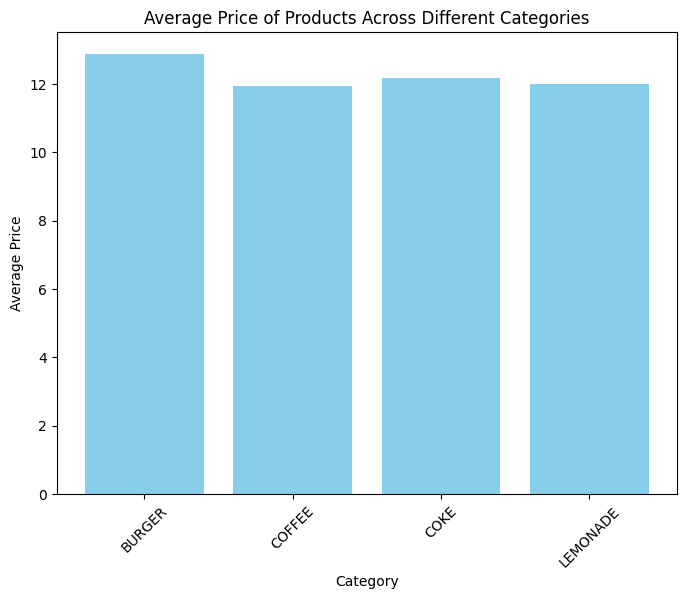

In [18]:
avg_price_per_category = df.groupby('item')['price'].mean().reset_index()
plt.figure(figsize=(8,6))
plt.bar(avg_price_per_category['item'], avg_price_per_category['price'], color='skyblue')
plt.xlabel('Category')
plt.ylabel('Average Price')
plt.title('Average Price of Products Across Different Categories')
plt.xticks(rotation=45)
plt.show()

# How does the quantity sold vary with price for different items?

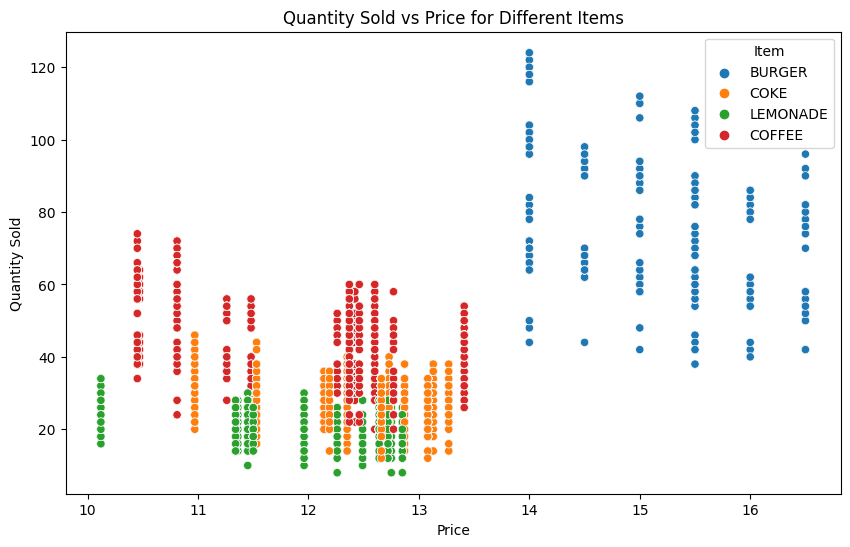

In [19]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(10, 6))
sns.scatterplot(data=df, x='price', y='qty', hue='item')
plt.xlabel('Price')
plt.ylabel('Quantity Sold')
plt.title('Quantity Sold vs Price for Different Items')
plt.legend(title='Item')
plt.show()

# Is there a notable difference in the quantity sold during holidays compared to non-holidays at different price points?

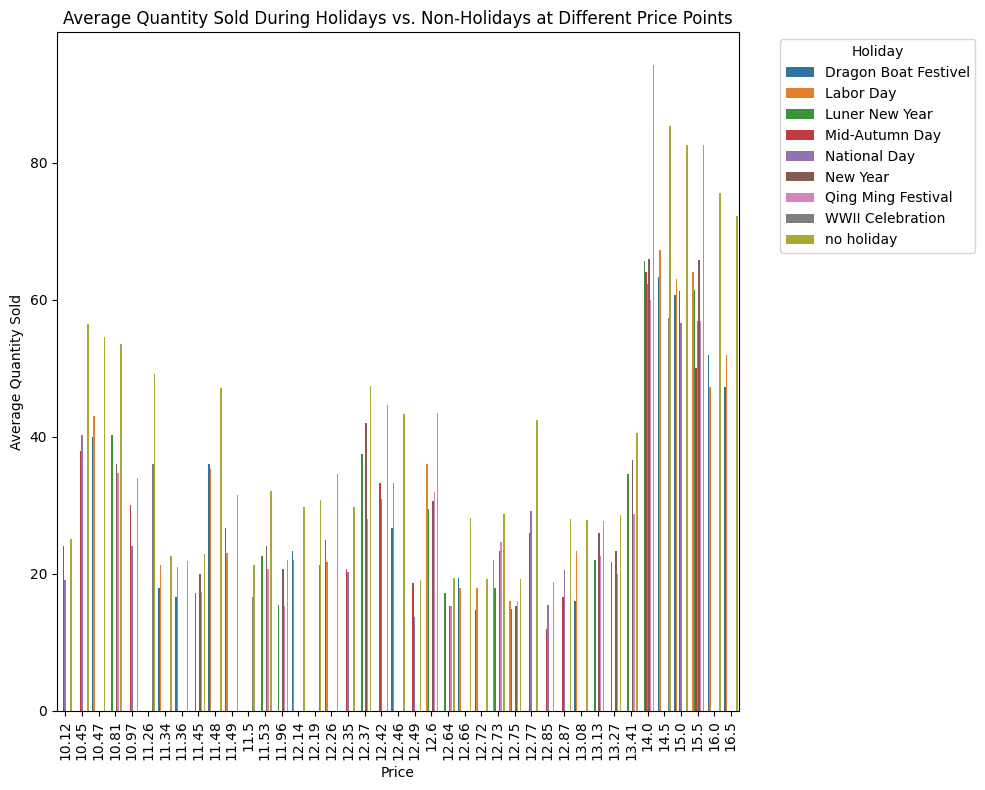

In [20]:
# Assuming df is your DataFrame and the necessary preprocessing has been done
grouped_data = df.groupby(['holiday', 'price'])['qty'].mean().reset_index()

plt.figure(figsize=(10, 8))
sns.barplot(x='price', y='qty', hue='holiday', data=grouped_data)
plt.xlabel('Price')
plt.ylabel('Average Quantity Sold')
plt.title('Average Quantity Sold During Holidays vs. Non-Holidays at Different Price Points')
plt.xticks(rotation=90)

# Move the legend outside of the plot
plt.legend(title='Holiday', bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()  # Adjusts the plot to make room for the legend
plt.show()

# 3. Does the weekend influence the quantity sold at varying prices?

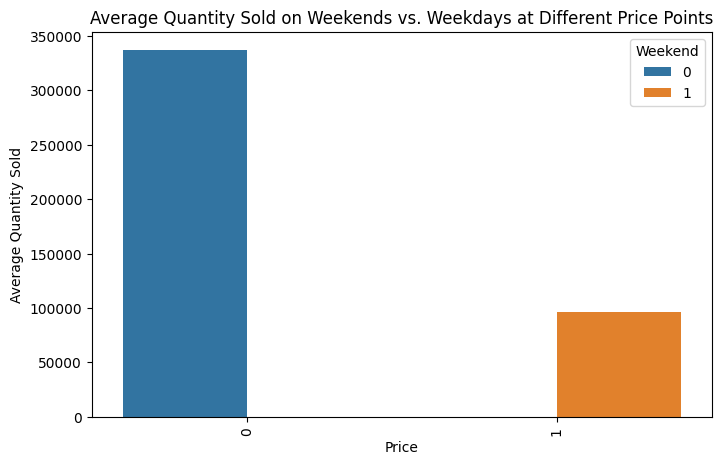

In [21]:
weekend_data=df.groupby(['is_weekend'])['qty'].sum().reset_index()


# Visualization
plt.figure(figsize=(8, 5))
sns.barplot(x='is_weekend', y='qty', hue='is_weekend', data=weekend_data)
plt.xlabel('Price')
plt.ylabel('Average Quantity Sold')
plt.title('Average Quantity Sold on Weekends vs. Weekdays at Different Price Points')
plt.legend(title='Weekend')
plt.xticks(rotation=90)
plt.show()

In [22]:
df.head()

,date,price,qty,sell_id,sell_cat,item,year,holiday,is_weekend,is_schoolbreak,avg_temperature,is_outdoor,is_event,revenue
0,1/1/12,15.50,46,1070,0,BURGER,2012,New Year,1,0,24.8,0,1,713.00
1,1/1/12,12.73,22,2051,2,BURGER,2012,New Year,1,0,24.8,0,1,280.06
2,1/1/12,12.73,22,2051,2,COKE,2012,New Year,1,0,24.8,0,1,280.06
3,1/1/12,12.75,18,2052,2,BURGER,2012,New Year,1,0,24.8,0,1,229.50
4,1/1/12,12.75,18,2052,2,LEMONADE,2012,New Year,1,0,24.8,0,1,229.50


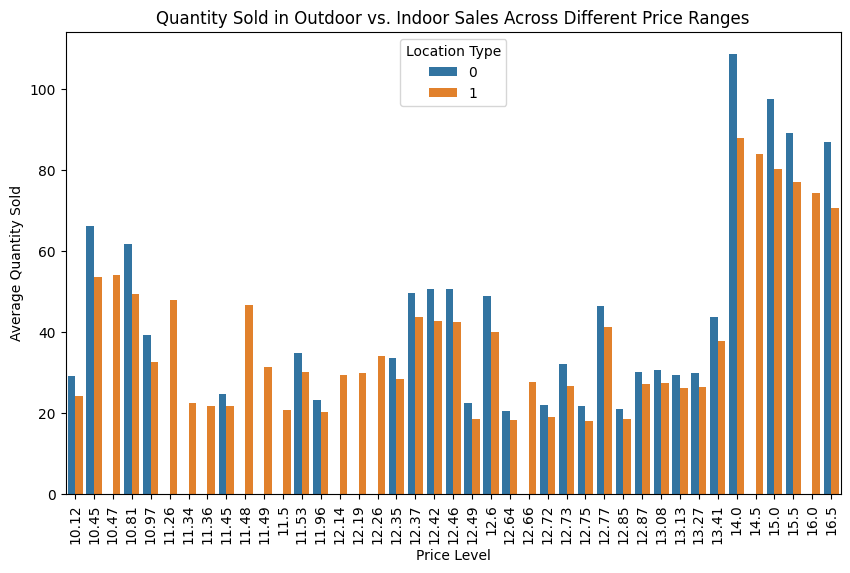

In [23]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns





# Grouping the data
grouped_data = df.groupby(['is_outdoor', 'price'])['qty'].mean().reset_index()

# Visualization
plt.figure(figsize=(10, 6))
sns.barplot(x='price', y='qty', hue='is_outdoor', data=grouped_data)
plt.xlabel('Price Level')
plt.ylabel('Average Quantity Sold')
plt.title('Quantity Sold in Outdoor vs. Indoor Sales Across Different Price Ranges')
plt.legend(title='Location Type')
plt.xticks(rotation=90)
plt.show()


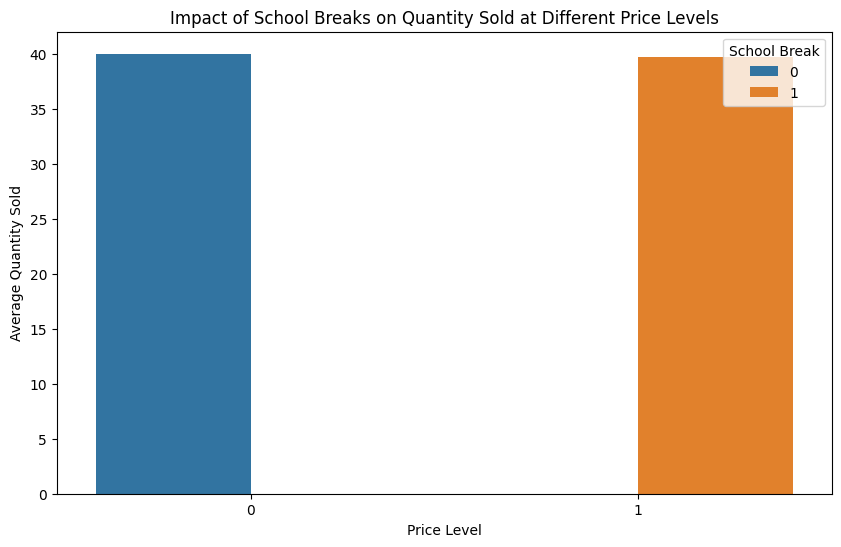

In [24]:

# Grouping the data
grouped_data = df.groupby(['is_schoolbreak'])['qty'].mean().reset_index()

# Visualization
plt.figure(figsize=(10, 6))
sns.barplot(x='is_schoolbreak', y='qty', hue='is_schoolbreak', data=grouped_data)
plt.xlabel('Price Level')
plt.ylabel('Average Quantity Sold')
plt.title('Impact of School Breaks on Quantity Sold at Different Price Levels')
plt.legend(title='School Break')
plt.show()

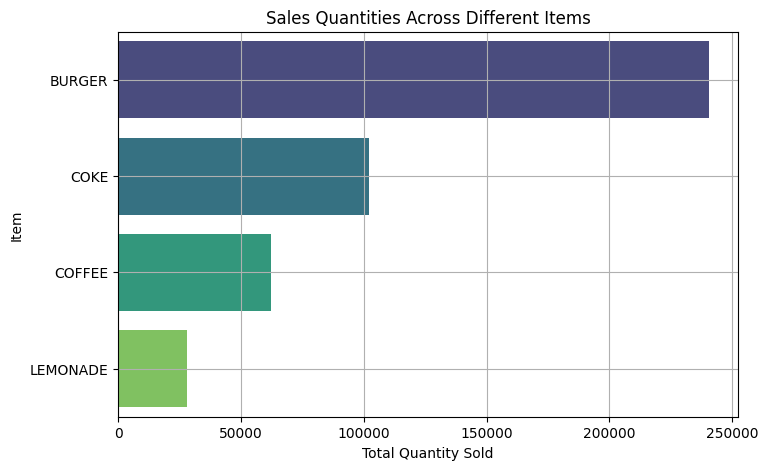

In [25]:
# Calculating total sales quantities for each item
sales_quantities_by_item = df.groupby('item')['qty'].sum().sort_values(ascending=False).reset_index()

# Creating a bar plot to visualize the sales quantities for different items
plt.figure(figsize=(8, 5))
sns.barplot(x='qty', y='item', data=sales_quantities_by_item, palette='viridis')
plt.title('Sales Quantities Across Different Items')
plt.xlabel('Total Quantity Sold')
plt.ylabel('Item')
plt.grid(True)
plt.show()


In [26]:
# Grouping the data by item and calculating average price, quantity, and revenue
grouped_data = df.groupby('item').agg({
    'price': 'mean',
    'qty': 'mean',
    'revenue': 'mean'
}).reset_index()

grouped_data.head()


,item,price,qty,revenue
0,BURGER,12.871094,44.334317,595.727793
1,COFFEE,11.945299,46.069373,545.564413
2,COKE,12.166823,37.643542,453.358937
3,LEMONADE,11.990539,20.730627,247.161742


In [27]:
from sklearn.preprocessing import OneHotEncoder

# One-hot encoding the 'item' column
encoder_item = OneHotEncoder(sparse=False) 
item_encoded = encoder_item.fit_transform(df[['item']])

# Creating a DataFrame for the encoded 'item' data
df_encoded = pd.DataFrame(item_encoded, columns=encoder_item.get_feature_names_out(['item']))

# Concatenating the encoded 'item' data with the original data
df_encoded = pd.concat([df, df_encoded], axis=1)

# Dropping the original 'item' column and other non-numeric columns
df_encoded.drop(['date', 'item', 'sell_id','year'], axis=1, inplace=True)

# One-hot encoding the 'holiday' column as well 
encoder_holiday = OneHotEncoder(sparse=False, drop='first')  # Define a new encoder for the holiday column
holiday_encoded = encoder_holiday.fit_transform(df[['holiday']])
encoded_holiday_df = pd.DataFrame(holiday_encoded, columns=encoder_holiday.get_feature_names_out(['holiday']))

# Concatenating the encoded 'holiday' data with the original data
df_encoded = pd.concat([df_encoded, encoded_holiday_df], axis=1)
df_encoded.drop('holiday', axis=1, inplace=True)

# Displaying the first few rows of the modified dataset
df_encoded.head()


,price,qty,sell_cat,is_weekend,is_schoolbreak,avg_temperature,is_outdoor,is_event,revenue,item_BURGER,...,item_COKE,item_LEMONADE,holiday_Labor Day,holiday_Luner New Year,holiday_Mid-Autumn Day,holiday_National Day,holiday_New Year,holiday_Qing Ming Festival,holiday_WWII Celebration,holiday_no holiday
0,15.50,46,0,1,0,24.8,0,1,713.00,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
1,12.73,22,2,1,0,24.8,0,1,280.06,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
2,12.73,22,2,1,0,24.8,0,1,280.06,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
3,12.75,18,2,1,0,24.8,0,1,229.50,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
4,12.75,18,2,1,0,24.8,0,1,229.50,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0


In [28]:
# Redefining the dependent variable (y) as 'qty' and independent variables (X)
y = df_encoded['qty']
X = df_encoded.drop('qty', axis=1)  # Dropping 'qty' from the independent variables

# Adding a constant to the model (intercept)
X= sm.add_constant(X)
X['is_event'] = pd.to_numeric(X['is_event'])
# Building the OLS model with 'qty' as the dependent variable
model = sm.OLS(y, X).fit()

# Getting the summary of the new model
model_summary = model.summary()


In [29]:
model_summary

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    qty   R-squared:                       0.994
Model:                            OLS   Adj. R-squared:                  0.994
Method:                 Least Squares   F-statistic:                 9.831e+04
Date:                Tue, 26 Dec 2023   Prob (F-statistic):               0.00
Time:                        22:00:34   Log-Likelihood:                -20692.
No. Observations:               10840   AIC:                         4.142e+04
Df Residuals:                   10821   BIC:                         4.156e+04
Df Model:                          18                                         
Covariance Type:            nonrobust                                         
==============================================================================================
                                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------
const                         22.0915      0.214    103.086      0.000      21.671      22.512
price                         -3.4875      0.019   -186.232      0.000      -3.524      -3.451
sell_cat                       2.9088      0.071     40.746      0.000       2.769       3.049
is_weekend                    -0.0203      0.041     -0.496      0.620      -0.100       0.060
is_schoolbreak                -0.0913      0.043     -2.117      0.034      -0.176      -0.007
avg_temperature               -0.0017      0.001     -1.628      0.104      -0.004       0.000
is_outdoor                    -0.0095      0.058     -0.163      0.871      -0.124       0.105
is_event                      11.0144      0.148     74.615      0.000      10.725      11.304
revenue                        0.0779      0.000    581.356      0.000       0.078       0.078
item_BURGER                    5.4052      0.057     94.554      0.000       5.293       5.517
item_COFFEE                    6.3646      0.075     85.241      0.000       6.218       6.511
item_COKE                      5.8938      0.066     89.478      0.000       5.765       6.023
item_LEMONADE                  4.4279      0.058     76.544      0.000       4.315       4.541
holiday_Labor Day              0.0977      0.236      0.414      0.679      -0.365       0.561
holiday_Luner New Year         0.2915      0.207      1.406      0.160      -0.115       0.698
holiday_Mid-Autumn Day         0.3990      0.275      1.452      0.147      -0.140       0.938
holiday_National Day          -0.0997      0.209     -0.476      0.634      -0.510       0.311
holiday_New Year               0.3110      0.251      1.238      0.216      -0.182       0.803
holiday_Qing Ming Festival     0.2794      0.237      1.179      0.238      -0.185       0.744
holiday_WWII Celebration      -0.4444      0.373     -1.192      0.233      -1.175       0.287
holiday_no holiday            11.0771      0.125     88.600      0.000      10.832      11.322
==============================================================================
Omnibus:                      757.510   Durbin-Watson:                   1.428
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             3823.807
Skew:                          -0.085   Prob(JB):                         0.00
Kurtosis:                       5.905   Cond. No.                     7.34e+17
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The smallest eigenvalue is 7.33e-27. This might indicate that there are
strong multicollinearity problems or that the design matrix is singular.
"""

In [30]:
params_df=model.params

In [31]:
пр.log((params_df['holiday_New Year'] + params_df['const'])/(params_df['holiday_no holiday'] + params_df['const']))

-0.3924315786332634

In [32]:
filtered_data = df.query('holiday == "no holiday"')
unique_products = filtered_data['item'].unique()

all_results = pd.DataFrame()

for product in unique_products:
    product_data = filtered_data[filtered_data['item'] == product]
    X_values = product_data['price']
    y_values = product_data['qty']
    quantiles = [0.025, 0.5, 0.975]
    results_dict = {}

    for q in quantiles:
        model = ExpectileGAM(s(0), expectile=q)
        model.fit(X_values, y_values)
        results_dict[f"pred_{q}"] = model.predict(X_values)
        results_dict[f"revenue_pred_{q}"] = model.predict(X_values) * product_data['price']

    predicted_values_df = pd.DataFrame(results_dict).set_index(X_values.index)
    combined_df = pd.concat([product_data[['price', 'item', 'qty']], predicted_values_df], axis=1)

    all_results = pd.concat([all_results, combined_df], axis=0)

all_results['revenue'] = all_results['qty'] * all_results['price']

all_results.head()


,price,item,qty,pred_0.025,revenue_pred_0.025,pred_0.5,revenue_pred_0.5,pred_0.975,revenue_pred_0.975,revenue
24,15.50,BURGER,88,62.130305,963.019727,82.458924,1278.113319,100.470947,1557.299681,1364.00
25,12.73,BURGER,26,16.938389,215.625690,27.061820,344.496975,43.943081,559.395420,330.98
27,12.75,BURGER,24,16.801169,214.214900,26.500720,337.884176,43.227954,551.156414,306.00
29,12.60,BURGER,42,18.200317,229.323999,31.548800,397.514883,47.911415,603.683824,529.20
32,15.50,BURGER,104,62.130305,963.019727,82.458924,1278.113319,100.470947,1557.299681,1612.00


In [33]:

# data_filtered = df.query('holiday == "no holiday"')
# unique_products = data_filtered['item'].unique()

# all_gam_results = pd.DataFrame()

# for item in unique_products:
#     product_data = data_filtered[data_filtered['item'] == item]
#     X = product_data['price']
#     y = product_data['qty']
#     quantiles = [0.025, 0.5, 0.975]
#     gam_results = {}

#     for q in quantiles:
#         gam = ExpectileGAM(s(0), expectile=q)
#         gam.fit(X, y)
#         gam_results[f"pred_{q}"] = gam.predict(X)
#         gam_results[f"revenue_pred_{q}"] = gam.predict(X) * product_data['price']  # Calculate revenue

#     pred_gam = pd.DataFrame(gam_results).set_index(X.index)
#     pred_gam_df = pd.concat([product_data[['price', 'item', 'qty']], pred_gam], axis=1)

#     all_gam_results = pd.concat([all_gam_results, pred_gam_df], axis=0)

# # Add a column 'revenue' which is the product of 'qty' and 'price'
# all_gam_results['revenue'] = all_gam_results['qty'] * all_gam_results['price']

# all_gam_results.head()

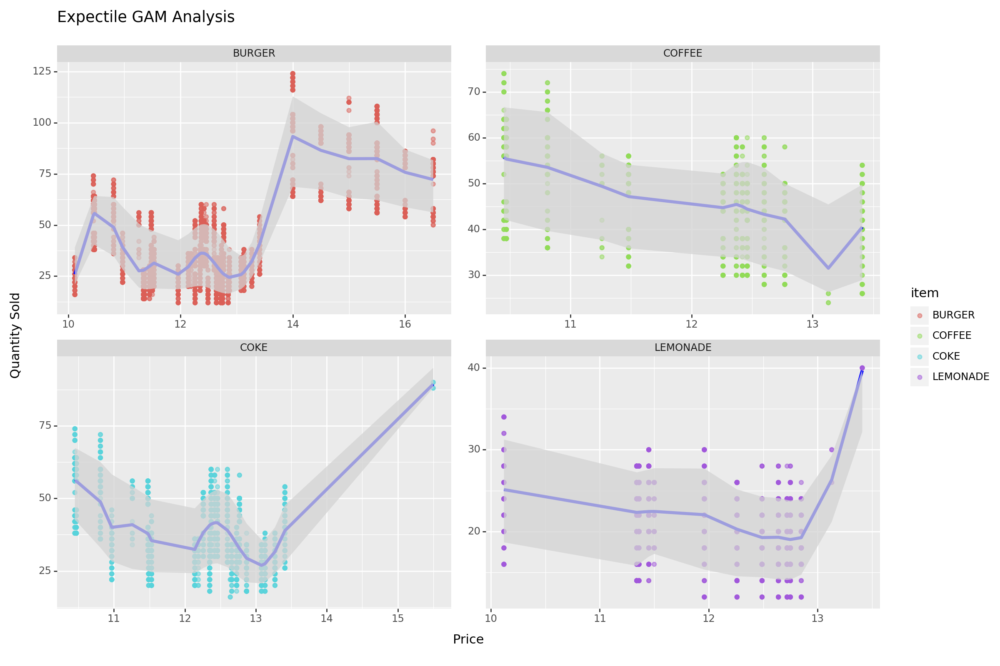

In [34]:
from plotnine import ggplot, aes, geom_point, geom_line, geom_ribbon, facet_wrap, theme

# Create the ggplot
plot = (ggplot(all_results, aes(x='price', y='qty', color='item'))
        + geom_point(alpha=0.5)  # Plot the original data points
        + geom_line(aes(y='pred_0.5'), color='blue', size=1.5)  # Darker line for median prediction
        + geom_ribbon(aes(ymin='pred_0.025', ymax='pred_0.975'), fill='#d3d3d3', color='#FF000000', alpha=0.75, 
                      show_legend=False)  # Grey ribbon for the 2.5th and 97.5th percentiles
        + facet_wrap('item', scales='free')  # Separate plots for each product
        + labs(title='Expectile GAM Analysis', x='Price', y='Quantity Sold')  # Add labels and title
        + theme(figure_size=(12, 8))  # Increase the size of the plot (width, height) in inches
)

# Display the plot
print(plot)


In [35]:
# Find the best entries for quantiles 0.25, 0.5, and 0.975
best_025 = all_results.groupby('item').apply(lambda x: x.nlargest(1, 'revenue_pred_0.025')).reset_index(level=0, drop=True)
best_050 = all_results.groupby('item').apply(lambda x: x.nlargest(1, 'revenue_pred_0.5')).reset_index(level=0, drop=True)
best_0975 = all_results.groupby('item').apply(lambda x: x.nlargest(1, 'revenue_pred_0.975')).reset_index(level=0, drop=True)

# Displaying the results
best_025

,price,item,qty,pred_0.025,revenue_pred_0.025,pred_0.5,revenue_pred_0.5,pred_0.975,revenue_pred_0.975,revenue
6768,14.50,BURGER,62,67.352125,976.605812,86.493336,1254.153369,104.665081,1517.643673,899.0
4855,10.45,COFFEE,56,42.265800,441.677611,55.736003,582.441227,66.745521,697.490694,585.2
3396,15.50,COKE,90,88.096213,1365.491295,89.366387,1385.179005,94.972779,1472.078069,1395.0
3416,13.41,LEMONADE,40,32.187237,431.630851,39.680516,532.115719,39.790825,533.594967,536.4


In [36]:

best_050

,price,item,qty,pred_0.025,revenue_pred_0.025,pred_0.5,revenue_pred_0.5,pred_0.975,revenue_pred_0.975,revenue
4848,14.00,BURGER,100,68.673660,961.431245,93.290438,1306.066128,112.893942,1580.515187,1400.0
4855,10.45,COFFEE,56,42.265800,441.677611,55.736003,582.441227,66.745521,697.490694,585.2
3396,15.50,COKE,90,88.096213,1365.491295,89.366387,1385.179005,94.972779,1472.078069,1395.0
3416,13.41,LEMONADE,40,32.187237,431.630851,39.680516,532.115719,39.790825,533.594967,536.4


In [37]:
best_0975

,price,item,qty,pred_0.025,revenue_pred_0.025,pred_0.5,revenue_pred_0.5,pred_0.975,revenue_pred_0.975,revenue
4848,14.00,BURGER,100,68.673660,961.431245,93.290438,1306.066128,112.893942,1580.515187,1400.00
8695,10.81,COFFEE,54,39.658586,428.709313,53.539401,578.760923,65.596790,709.101296,583.74
3396,15.50,COKE,90,88.096213,1365.491295,89.366387,1385.179005,94.972779,1472.078069,1395.00
3416,13.41,LEMONADE,40,32.187237,431.630851,39.680516,532.115719,39.790825,533.594967,536.40


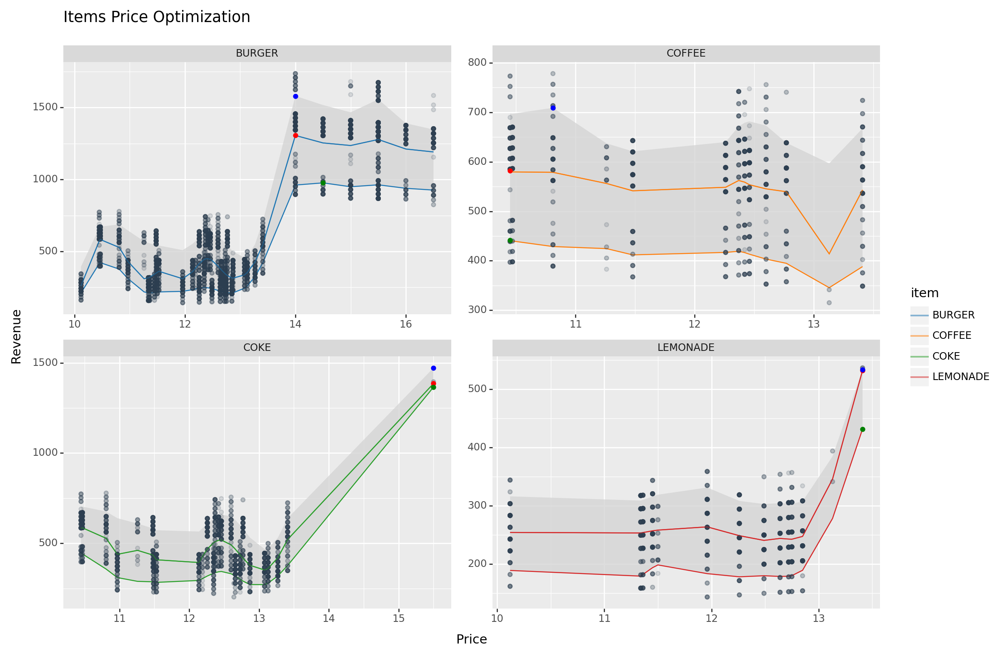

In [38]:
from plotnine import ggplot, aes, geom_point, geom_line, geom_ribbon, facet_wrap, labs, theme, scale_color_manual

# ... [previous code]

plot = (ggplot(all_results, aes(x='price', y='revenue_pred_0.5', color='item', group='item'))
        + geom_ribbon(aes(ymin='revenue_pred_0.025', ymax='revenue_pred_0.975'), fill='#d3d3d3', alpha=0.75, show_legend=False)
        + geom_point(aes(y='revenue'), alpha=0.15, color='#2C3E50')  # Original data points
        + geom_line(aes(y='revenue_pred_0.5'), alpha=0.5)
        + geom_point(aes(y='revenue_pred_0.5'), data=best_050, color='red')  # Best 0.5 revenue points
        + geom_point(aes(y='revenue_pred_0.975'), data=best_0975, color='blue')  # Best 0.975 revenue points
        + geom_point(aes(y='revenue_pred_0.025'), data=best_025, color='green')  # Best 0.025 revenue points
        + facet_wrap('item', scales='free')  # Separate plots for each product
        + labs(title='Items Price Optimization', x='Price', y='Revenue')  # Add labels and title
        + theme(figure_size=(12, 8))  # Increase the size of the plot
        + scale_color_manual(values=['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2', '#7f7f7f', '#bcbd22', '#17becf'])
)

# Display the plot
print(plot)


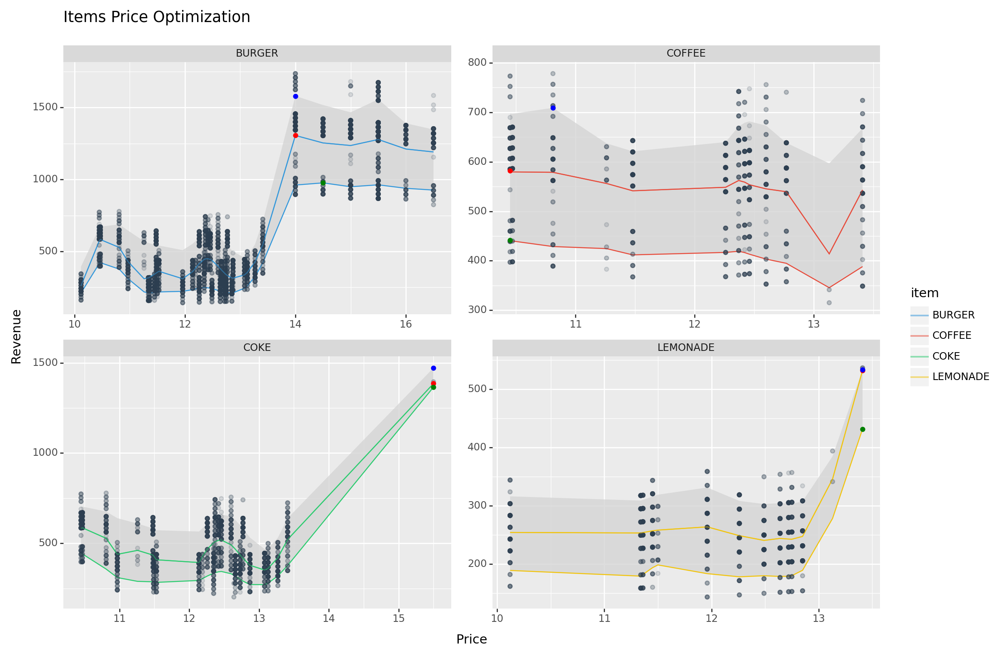

In [39]:

# Define a more visually appealing color palette
color_palette = ['#3498db', '#e74c3c', '#2ecc71', '#f1c40f', '#9b59b6', '#34495e', '#1abc9c', '#d35400', '#7f8c8d']

plot = (ggplot(all_results, aes(x='price', y='revenue_pred_0.5', color='item', group='item'))
        + geom_ribbon(aes(ymin='revenue_pred_0.025', ymax='revenue_pred_0.975'), fill='#d3d3d3', alpha=0.75, 
                      show_legend=False)
        + geom_point(aes(y='revenue'), alpha=0.15, color='#2C3E50')  # Original data points
        + geom_line(aes(y='revenue_pred_0.5'), alpha=0.5)
        + geom_point(aes(y='revenue_pred_0.5'), data=best_050, color='red')  # Best 0.5 revenue points
        + geom_point(aes(y='revenue_pred_0.975'), data=best_0975, color='blue')  # Best 0.975 revenue points
        + geom_point(aes(y='revenue_pred_0.025'), data=best_025, color='green')  # Best 0.025 revenue points
        + facet_wrap('item', scales='free')  # Separate plots for each product
        + labs(title='Items Price Optimization', x='Price', y='Revenue')  # Add labels and title
        + theme(figure_size=(12, 8))  # Increase the size of the plot
        + scale_color_manual(values=color_palette)
)

# Display the plot
print(plot)

In [40]:
# # Define a list of the specific holidays
# holiday_list = [
#     'New Year', 'Luner New Year', 'Qing Ming Festival',
#     'Labor Day', 'Dragon Boat Festivel', 'Mid-Autumn Day',
#     'National Day', 'WWII Celebration'
# ]

# # Filter the data for entries that are on the specified holidays
# filtered_data = df[df['holiday'].isin(holiday_list)]
# unique_products = filtered_data['item'].unique()

# all_results_holidays = pd.DataFrame()

# for product in unique_products:
#     product_data = filtered_data[filtered_data['item'] == product]
#     X_values = product_data['price']
#     y_values = product_data['qty']
#     quantiles = [0.025, 0.5, 0.975]
#     results_dict = {}

#     for q in quantiles:
#         model = ExpectileGAM(s(0), expectile=q)
#         model.fit(X_values, y_values)
#         results_dict[f"pred_{q}"] = model.predict(X_values)
#         results_dict[f"revenue_pred_{q}"] = model.predict(X_values) * X_values  # Multiply by price to get revenue

#     predicted_values_df = pd.DataFrame(results_dict).set_index(X_values.index)
#     combined_df = pd.concat([product_data[['price', 'item', 'qty']], predicted_values_df], axis=1)

#     all_results_holidays = pd.concat([all_results_holidays, combined_df], axis=0)

# all_results_holidays['revenue'] = all_results_holidays['qty'] * all_results_holidays['price']


In [41]:
# # Find the best entries for quantiles 0.025, 0.5, and 0.975 for the specified holidays
# best_025_holidays = all_results_holidays.groupby('item').apply(lambda x: x.nlargest(1, 'revenue_pred_0.025')).reset_index(level=0, drop=True)
# best_050_holidays = all_results_holidays.groupby('item').apply(lambda x: x.nlargest(1, 'revenue_pred_0.5')).reset_index(level=0, drop=True)
# best_0975_holidays = all_results_holidays.groupby('item').apply(lambda x: x.nlargest(1, 'revenue_pred_0.975')).reset_index(level=0, drop=True)


In [42]:
# # Visualization code remains the same, just update the title and data source
# plot_holidays = (ggplot(all_results_holidays, aes(x='price', y='revenue_pred_0.5', color='item', group='item'))
#                  + geom_ribbon(aes(ymin='revenue_pred_0.025', ymax='revenue_pred_0.975'), fill='#d3d3d3', alpha=0.75, 
#                                show_legend=False)
#                  + geom_point(aes(y='revenue'), alpha=0.15, color='#2C3E50')  # Original data points
#                  + geom_line(aes(y='revenue_pred_0.5'), alpha=0.5)
#                  + geom_point(aes(y='revenue_pred_0.5'), data=best_050_holidays, color='red')  # Best 0.5 revenue points for specified holidays
#                  + geom_point(aes(y='revenue_pred_0.975'), data=best_0975_holidays, color='blue')  # Best 0.975 revenue points for specified holidays
#                  + geom_point(aes(y='revenue_pred_0.025'), data=best_025_holidays, color='green')  # Best 0.025 revenue points for specified holidays
#                  + facet_wrap('item', scales='free')  # Separate plots for each product
#                  + labs(title='Items Price Optimization for Specific Holidays', x='Price', y='Revenue')  # Update title for specified holidays
#                  + theme(figure_size=(12, 8))  # Increase the size of the plot
#                  + scale_color_manual(values=color_palette)
# )

# # Display the plot for the specified holidays
# print(plot_holidays)

did not converge
did not converge
did not converge
did not converge
did not converge
did not converge
did not converge
did not converge
did not converge
did not converge


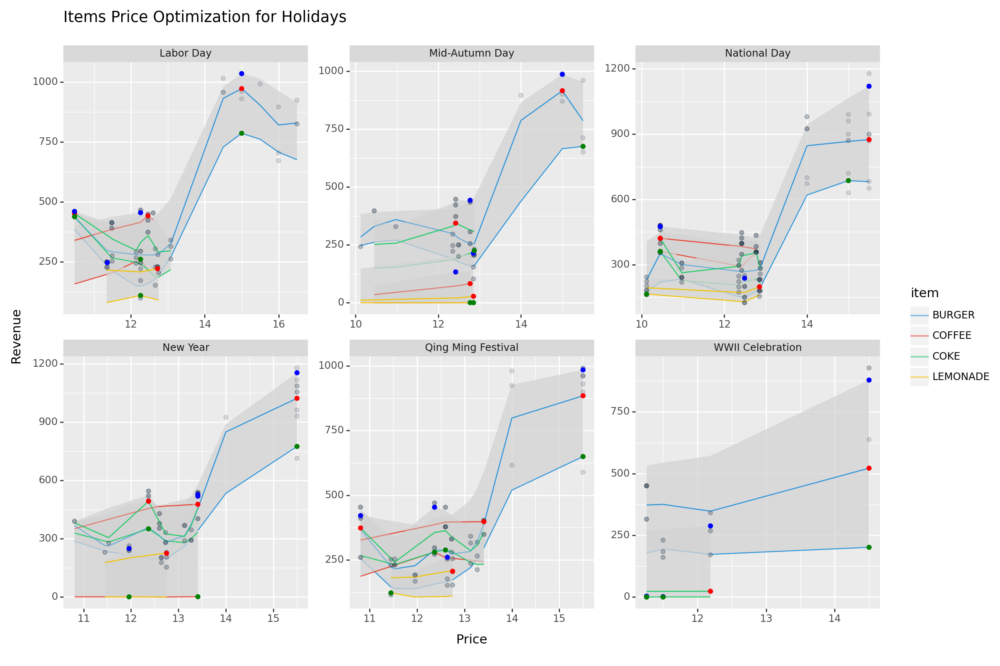

In [46]:
import pandas as pd
from pygam import ExpectileGAM, s
from plotnine import ggplot, aes, geom_point, geom_line, geom_ribbon, facet_wrap, labs, theme, scale_color_manual

# Assuming 'df' is your DataFrame and it contains 'holiday', 'item', 'price', and 'qty' columns

# Define a list of the specific holidays
holiday_list = [
    'New Year', 'Lunar New Year', 'Qing Ming Festival',
    'Labor Day', 'Dragon Boat Festival', 'Mid-Autumn Day',
    'National Day', 'WWII Celebration'
]

# Initialize an empty DataFrame to store all results for holidays
all_results_holidays = pd.DataFrame()

# Perform the analysis for each holiday
for holiday_name in holiday_list:
    # Filter data for the current holiday
    filtered_data = df.query('holiday == @holiday_name')
    unique_products = filtered_data['item'].unique()

    for product in unique_products:
        product_data = filtered_data[filtered_data['item'] == product]
        X_values = product_data['price']
        y_values = product_data['qty']
        quantiles = [0.025, 0.5, 0.975]
        results_dict = {}

        for q in quantiles:
            model = ExpectileGAM(s(0), expectile=q)
            try:
                model.fit(X_values, y_values)
                results_dict[f"revenue_pred_{q}"] = model.predict(X_values) * X_values
            except ValueError:
                print(f"Model did not converge for {product} during {holiday_name}")

        predicted_values_df = pd.DataFrame(results_dict)
        combined_df = pd.concat([product_data[['price', 'item', 'qty']], predicted_values_df], axis=1)
        combined_df['holiday'] = holiday_name  # Add holiday column

        all_results_holidays = pd.concat([all_results_holidays, combined_df], axis=0)

# Calculate the actual revenue for the holiday data
all_results_holidays['revenue'] = all_results_holidays['qty'] * all_results_holidays['price']

# Find the best entries for quantiles 0.025, 0.5, and 0.975 for holidays
best_025_holidays = all_results_holidays.groupby(['item', 'holiday']).apply(lambda x: x.nlargest(1, 'revenue_pred_0.025')).reset_index(drop=True)
best_050_holidays = all_results_holidays.groupby(['item', 'holiday']).apply(lambda x: x.nlargest(1, 'revenue_pred_0.5')).reset_index(drop=True)
best_0975_holidays = all_results_holidays.groupby(['item', 'holiday']).apply(lambda x: x.nlargest(1, 'revenue_pred_0.975')).reset_index(drop=True)

# Define a more visually appealing color palette
color_palette = ['#3498db', '#e74c3c', '#2ecc71', '#f1c40f', '#9b59b6', '#34495e', '#1abc9c', '#d35400', '#7f8c8d']

# Create the ggplot for holidays
plot_holidays = (ggplot(all_results_holidays, aes(x='price', y='revenue_pred_0.5', color='item', group='item'))
                 + geom_ribbon(aes(ymin='revenue_pred_0.025', ymax='revenue_pred_0.975'), fill='#d3d3d3', alpha=0.75, show_legend=False)
                 + geom_point(aes(y='revenue'), alpha=0.15, color='#2C3E50')
                 + geom_line(aes(y='revenue_pred_0.5'), alpha=0.5)
                 + geom_point(aes(y='revenue_pred_0.5'), data=best_050_holidays, color='red')
                 + geom_point(aes(y='revenue_pred_0.975'), data=best_0975_holidays, color='blue')
                 + geom_point(aes(y='revenue_pred_0.025'), data=best_025_holidays, color='green')
                 + facet_wrap('holiday', scales='free')  # Separate plots for each holiday
                 + labs(title='Items Price Optimization for Holidays', x='Price', y='Revenue')
                 + theme(figure_size=(12, 8))
                 + scale_color_manual(values=color_palette)
)

# Display the plot for holidays
print(plot_holidays)


In [54]:



# Define a list of the specific holidays
holiday_list = [
    'New Year', 'Lunar New Year', 'Qing Ming Festival',
    'Labor Day', 'Dragon Boat Festival', 'Mid-Autumn Day',
    'National Day', 'WWII Celebration'
]

# Initialize an empty DataFrame to store all results for holidays
all_results_holidays = pd.DataFrame()

# Perform the analysis for each holiday
for holiday_name in holiday_list:
    # Filter data for the current holiday
    filtered_data = df.query('holiday == @holiday_name')
    unique_products = filtered_data['item'].unique()

    for product in unique_products:
        product_data = filtered_data[filtered_data['item'] == product]
        X_values = product_data['price']
        y_values = product_data['qty']
        quantiles = [0.025, 0.5, 0.975]
        results_dict = {}

        for q in quantiles:
            model = ExpectileGAM(s(0), expectile=q)
            try:
                model.fit(X_values, y_values)
                results_dict[f"revenue_pred_{q}"] = model.predict(X_values) * X_values
            except ValueError:
                print(f"Model did not converge for {product} during {holiday_name}")

        predicted_values_df = pd.DataFrame(results_dict)
        combined_df = pd.concat([product_data[['price', 'item', 'qty']], predicted_values_df], axis=1)
        combined_df['holiday'] = holiday_name  # Add holiday column

        all_results_holidays = pd.concat([all_results_holidays, combined_df], axis=0)

# Calculate the actual revenue for the holiday data
all_results_holidays['revenue'] = all_results_holidays['qty'] * all_results_holidays['price']

# Find the best entries for the 50th percentile (median) predicted revenue for each item and holiday combination
best_050_holidays = all_results_holidays.groupby(['item', 'holiday']).apply(lambda x: x.loc[x['revenue_pred_0.5'].idxmax()]).reset_index(drop=True)

# Print out the best prices for each item for each holiday based on the 50th percentile
print("Best prices for each item for each holiday:")
print(best_050_holidays[['holiday', 'item', 'price', 'revenue_pred_0.5']])

did not converge
did not converge
did not converge
did not converge
did not converge
did not converge
did not converge
did not converge
did not converge
did not converge
Best prices for each item for each holiday:
               holiday      item  price  revenue_pred_0.5
0            Labor Day    BURGER  15.00        972.532619
1       Mid-Autumn Day    BURGER  15.00        916.110822
2         National Day    BURGER  15.50        874.736670
3             New Year    BURGER  15.50       1021.524000
4   Qing Ming Festival    BURGER  15.50        884.278883
5     WWII Celebration    BURGER  14.50        521.775495
6            Labor Day    COFFEE  12.46        441.852791
7       Mid-Autumn Day    COFFEE  12.77         82.743626
8         National Day    COFFEE  10.45        420.986047
9             New Year    COFFEE  13.41        476.486611
10  Qing Ming Festival    COFFEE  13.41        397.770724
11    WWII Celebration    COFFEE  11.26          0.684244
12           Labor Day      COKE

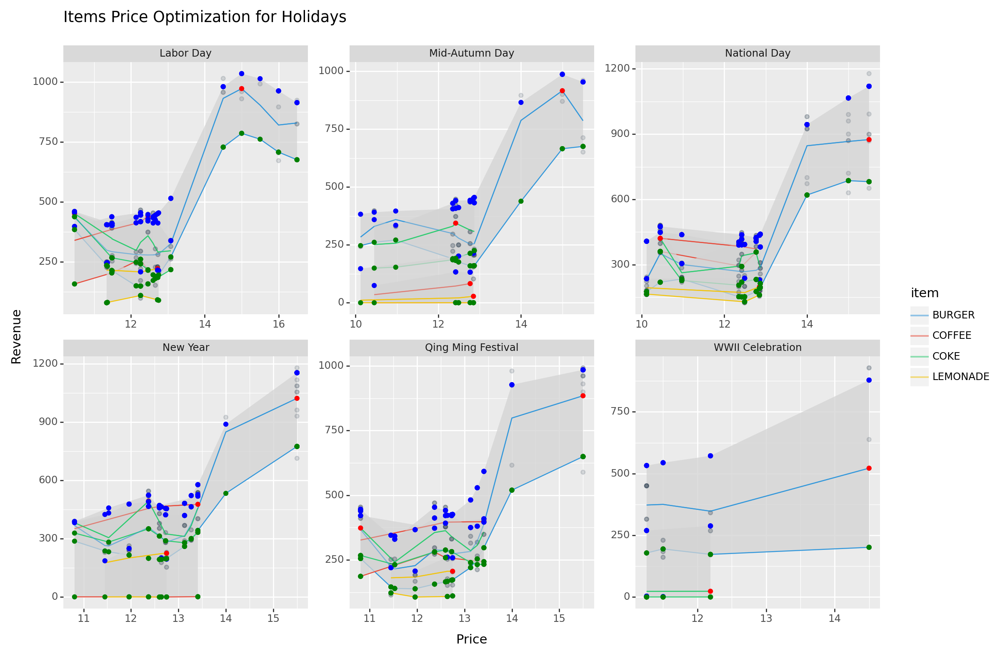

In [55]:


# Define a more visually appealing color palette for the plot
color_palette = ['#3498db', '#e74c3c', '#2ecc71', '#f1c40f', '#9b59b6', '#34495e', '#1abc9c', '#d35400', '#7f8c8d']


# Create the ggplot for holidays
plot_holidays = (ggplot(all_results_holidays, aes(x='price', y='revenue_pred_0.5', color='item', group='item'))
                 + geom_ribbon(aes(ymin='revenue_pred_0.025', ymax='revenue_pred_0.975'), fill='#d3d3d3', alpha=0.75, show_legend=False)
                 + geom_point(aes(y='revenue'), alpha=0.15, color='#2C3E50')
                 + geom_line(aes(y='revenue_pred_0.5'), alpha=0.5)
                 + geom_point(aes(y='revenue_pred_0.5'), data=best_050_holidays, color='red')
                 + geom_point(aes(y='revenue_pred_0.975'), data=all_results_holidays, color='blue')
                 + geom_point(aes(y='revenue_pred_0.025'), data=all_results_holidays, color='green')
                 + facet_wrap('holiday', scales='free')  # Separate plots for each holiday
                 + labs(title='Items Price Optimization for Holidays', x='Price', y='Revenue')
                 + theme(figure_size=(12, 8))
                 + scale_color_manual(values=color_palette)
)

# Display the plot for holidays
print(plot_holidays)
